In [78]:
using CSV
using DataFrames
using FFTW
using Plots
using DelimitedFiles
using StatsBase

In [79]:
function coordinates_to_angle(x1,y1,x2,y2)
    return atan(y2-y1,x2-x1)
end

coordinates_to_angle (generic function with 1 method)

In [80]:
coordinates_to_angle(0,0,1,-1)

-0.7853981633974483

In [81]:
# Define the grid dimensions and ranges
n = 550  # number of points along each axis
x_range = range(-22, 22, length=n)
y_range = range(-22, 22, length=n)

lambdaF = 1;

lambda = 3*lambdaF; ## This is the regularizer for divergence

p_F = 2*pi/lambdaF;

## The two impurities are at (a,0) and (-a,0)
a = 5*lambdaF;
r12 = 2*a;

In [82]:
function phi(r)
    return p_F*r - pi/4
end

phi (generic function with 1 method)

In [83]:
Delta = 10^(-3);
xi = 1/Delta;
T = 0.5*10^(-3);
dw = 2*pi*T;
wmax = 30*dw;
n_max = Int(round(wmax/dw));
wn_array = zeros(n_max);
theta12 = 0;

dV = 10^(-6);

u0 = 0.5;

In [84]:
dw

0.0031415926535897933

In [85]:
n_max

30

In [86]:
T

0.0005

In [87]:
pi*T

0.0015707963267948967

In [88]:
lambdaF*Delta

0.001

In [89]:
lambdaF*dw/2

0.0015707963267948967

In [90]:
lambdaF*dw

0.0031415926535897933

In [91]:
exp(-n_max*lambdaF*dw)

0.9100572406760248

In [92]:
function omega_n(n,tt)
    return (2 *n + 1)*pi*tt
end

omega_n (generic function with 1 method)

In [93]:
for ii = 0:n_max-1
    wn_array[ii+1] = omega_n(ii, T)
end

In [94]:
wn_array

30-element Vector{Float64}:
 0.0015707963267948967
 0.00471238898038469
 0.007853981633974483
 0.010995574287564275
 0.01413716694115407
 0.01727875959474386
 0.02042035224833366
 0.023561944901923447
 0.026703537555513242
 0.029845130209103034
 ⋮
 0.06754424205218056
 0.07068583470577035
 0.07382742735936014
 0.07696902001294993
 0.08011061266653972
 0.08325220532012952
 0.08639379797371932
 0.0895353906273091
 0.09267698328089889

In [95]:
1/(Delta^2 + wn_array[1]^2)

288400.4391420009

In [96]:
1/(Delta^2 + wn_array[Int(round(end/4))]^2)

1798.026763421286

In [ ]:
results_total_non_zero_Delta_2nd_order = DataFrame(x=Float64[], y=Float64[], value=Float64[])


for x in x_range, y in y_range

    r23 = sqrt((x-a)^2 + (y)^2);
    r31 = sqrt((x+a)^2 + (y)^2);

    theta23 =coordinates_to_angle(a,0,x,y) 
    theta31 =coordinates_to_angle(x,y,-a,0) 

    phi12 = phi(r12)
    phi23 = phi(r23)
    phi31 = phi(r31)


    value1 = 0;
    
    for jj = 1:n_max
        ### Need to add wn + im * dV in the exponential
        value1 += u0*((4*Delta^2*(Delta^2 - 2*wn_array[jj]^2)) /(Delta^2 + wn_array[jj]^2)^(5/2)) * cos(phi12) * cos(phi23) * cos(phi31) * (sin(theta12-theta23) * sin(theta12-theta31) * cos(theta23-theta31)) * exp(-(r12 + r23 + r31)*sqrt(wn_array[jj]^2+Delta^2)) * (2*T) *1/sqrt(sqrt(r12^2 + lambda^2) * sqrt(r23^2 + lambda^2) * sqrt(r31^2 + lambda^2))
        value1 += -u0*(Delta^2/(Delta^2 + wn_array[jj]^2)^(3/2)) * cos(phi12 + phi23 + phi31) * exp(-(r12 + r23 + r31)*sqrt(wn_array[jj]^2+Delta^2)) * (2*T) *1/sqrt(sqrt(r12^2 + lambda^2) * sqrt(r23^2 + lambda^2) * sqrt(r31^2 + lambda^2))
    end

    push!(results_total_non_zero_Delta_2nd_order, (x, y, value1))

end

# Save the results to a CSV file
# CSV.write("d+id_total_data_2nd_order.csv", results_total_non_zero_Delta_2nd_order, writeheader=false)

In [ ]:
maximum(results_total_non_zero_Delta_2nd_order.value)

(0.005156100907864311, 0.0)

In [ ]:
minimum(results_total_non_zero_Delta_2nd_order.value)

(-0.005145397123808467, 0.0)

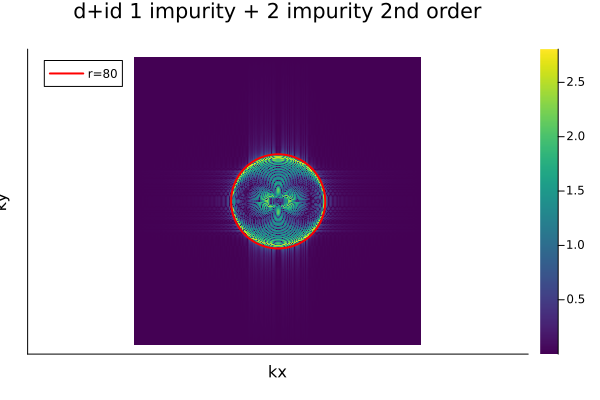

In [ ]:
# Extract columns
x = results_total_non_zero_Delta_2nd_order.x
y = results_total_non_zero_Delta_2nd_order.y
data = results_total_non_zero_Delta_2nd_order.value

# Get unique x and y values
unique_x = unique(x)
unique_y = unique(y)

# Reshape data into a 2D array
data_2d = reshape(data, length(unique_y), length(unique_x))

# Step 2: Perform 2D Fourier Transform
ft_data = fft(data_2d)
ft_data_shifted = fftshift(ft_data)

# Compute magnitude and log scale for better visualization
ft_magnitude = abs.(ft_data_shifted)
ft_magnitude_log = log1p.(ft_magnitude)  # log(1 + magnitude) for stability

# writedlm("d+id_total_data_FT.csv", ft_data_shifted, ',')

# Step 3: Plot the Fourier Transform
heatmap(
    kx_grid, ky_grid, ft_magnitude_log,
    color=:viridis, aspect_ratio=:equal, xticks=false, yticks=false,
    xlabel="kx", ylabel="ky",
    title="d+id 1 impurity + 2 impurity 2nd order",
)

# Overlay a ring at radius = 80
θ = range(0, 2π, length=500)
ring_radius = 90
plot!(
    ring_radius * cos.(θ),
    ring_radius * sin.(θ),
    color=:red, linewidth=2, label="r=80"
)

In [101]:
maximum(data_2d)

0.005156100907864311

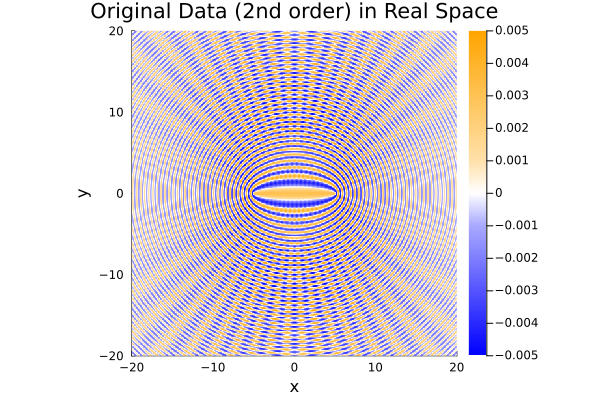

In [111]:
custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points
maxhere = 0.005

heatmap(
    unique_x, unique_y, data_2d,
    color=custom_cmap, aspect_ratio=:equal,
    xlabel="x", ylabel="y",
    title="Original Data (2nd order) in Real Space",
    clims=(-maxhere,maxhere),
    xlims=(-20, 20),  # Set the x-axis limits
    ylims=(-20, 20),   # Set the y-axis limits

)

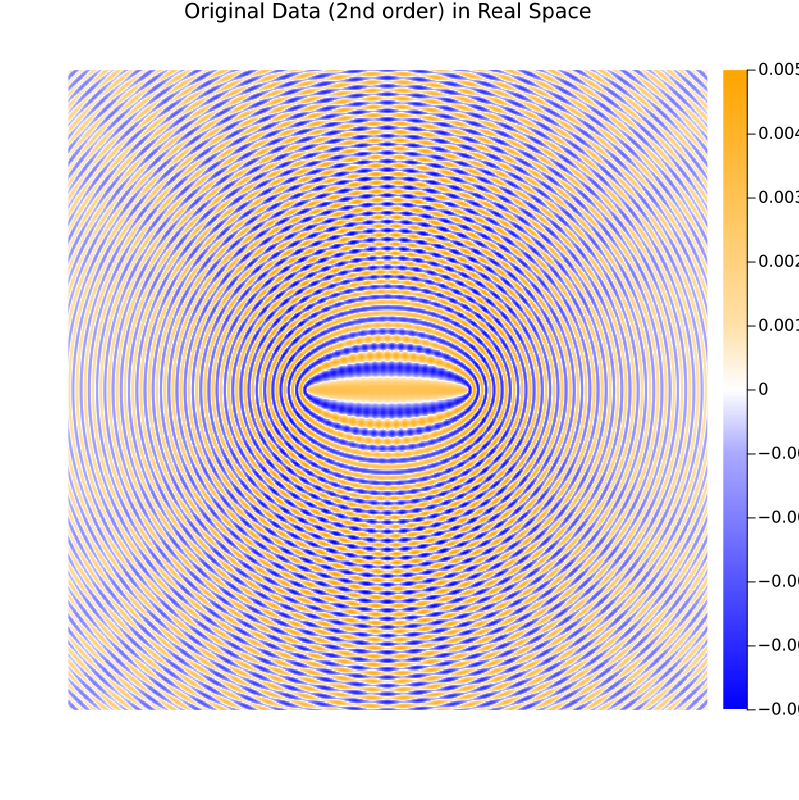

In [112]:
custom_cmap = cgrad([:blue, :white, :orange], [0.4, 0.6])  # Adjusting blend points

heatmap(
    unique_x, unique_y, data_2d,
    color=custom_cmap, aspect_ratio=:equal,
    xlabel="x", ylabel="y",
    title="Original Data (2nd order) in Real Space",
    clims=(-maxhere,maxhere),
    xlims=(-20, 20),  # Set the x-axis limits
    ylims=(-20, 20),  # Set the y-axis limits
    framestyle=:none, # Remove axis lines and frame
    size=(800,800)    # Make the plot bigger
)

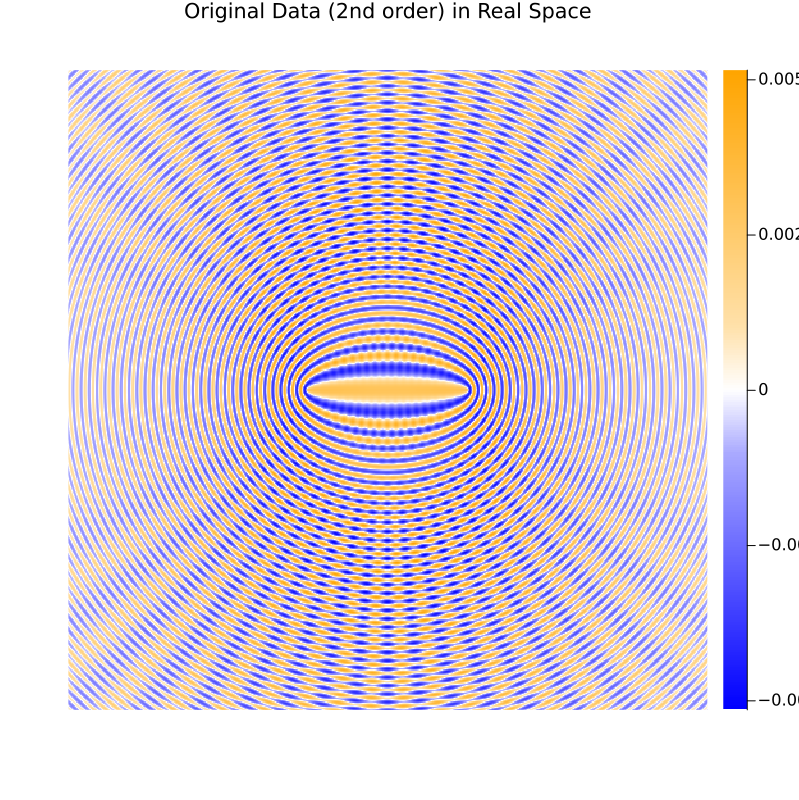

In [113]:
heatmap(
    unique_x, unique_y, data_2d,
    color=custom_cmap, aspect_ratio=:equal,
    xlabel="x", ylabel="y",
    title="Original Data (2nd order) in Real Space",
    # clims=(-maxhere,maxhere),
    xlims=(-20, 20),  # Set the x-axis limits
    ylims=(-20, 20),  # Set the y-axis limits
    framestyle=:none, # Remove axis lines and frame
    size=(800,800)    # Make the plot bigger
)

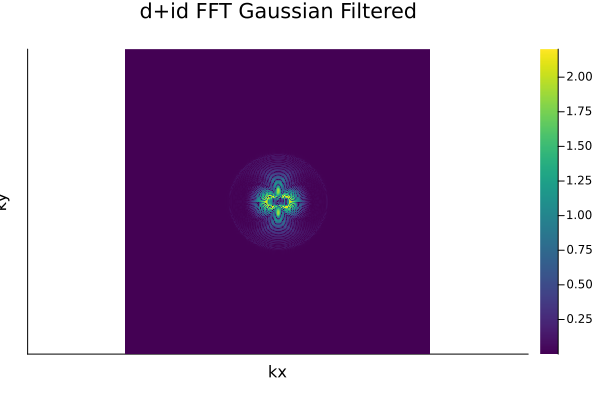

In [116]:
# Assuming `ft_data_shifted` is the shifted Fourier-transformed data and `unique_x`, `unique_y` are grid axes
# Step 1: Define the grid for Fourier space
nx, ny = size(ft_data_shifted)
kx = -nx÷2:nx÷2-1
ky = -ny÷2:ny÷2-1

# Create a grid for Fourier space
kx_grid, ky_grid = [k for k in kx], [k for k in ky]
kx_matrix = repeat(kx_grid', ny, 1)
ky_matrix = repeat(ky_grid, 1, nx)

# Step 2: Define the Gaussian mask
radius = 55.0  # Adjust the radius for the Gaussian mask
sigma = radius / 2.0  # Standard deviation of the Gaussian
gaussian_mask = exp.(-(kx_matrix.^2 .+ ky_matrix.^2) / (2 * sigma^2))

# # Step 3: Define the center removal mask
# center_radius = 50.0  # Radius of the central region to remove
# center_mask = ones(size(gaussian_mask)) - exp.(-(kx_matrix.^2 .+ ky_matrix.^2) / (2 * (center_radius)^2))

# # Step 4: Combine the Gaussian mask and the center removal mask
# combined_mask = gaussian_mask .* center_mask  # Element-wise multiplication

# Step 5: Apply the combined mask to the shifted Fourier transform
ft_data_shifted_filtered = ft_data_shifted .* gaussian_mask

# Step 6: Visualize the filtered data
heatmap(
    kx_grid, ky_grid, log1p.(abs.(ft_data_shifted_filtered)),
    color=:viridis, aspect_ratio=:equal, xticks=false, yticks=false,
    xlabel="kx", ylabel="ky",
    title="d+id FFT Gaussian Filtered"
)

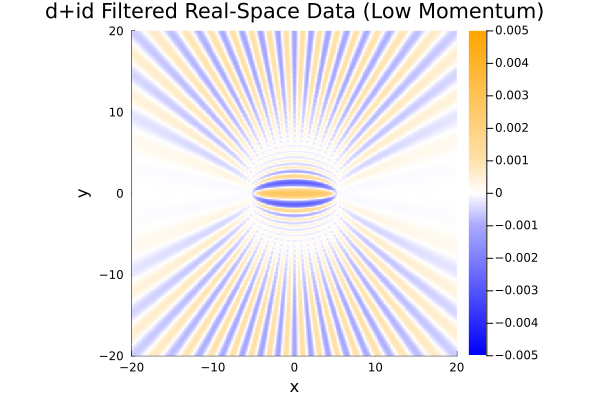

In [117]:
# Step 2: Map back to the unshifted Fourier space
ft_data_filtered = fftshift(ft_data_shifted_filtered)

# Step 3: Perform the Inverse Fourier Transform
filtered_data = ifft(ft_data_filtered)
filtered_data_real = real(filtered_data)
# maxhere = 0.001
heatmap(
    unique_x, unique_y, filtered_data_real,
    color=custom_cmap, aspect_ratio=:equal,
    xlabel="x", ylabel="y",
    xlims=(-20, 20),  # Set the x-axis limits
    ylims=(-20, 20),   # Set the y-axis limits
    clims=(-maxhere,maxhere),
    title="d+id Filtered Real-Space Data (Low Momentum)"
)

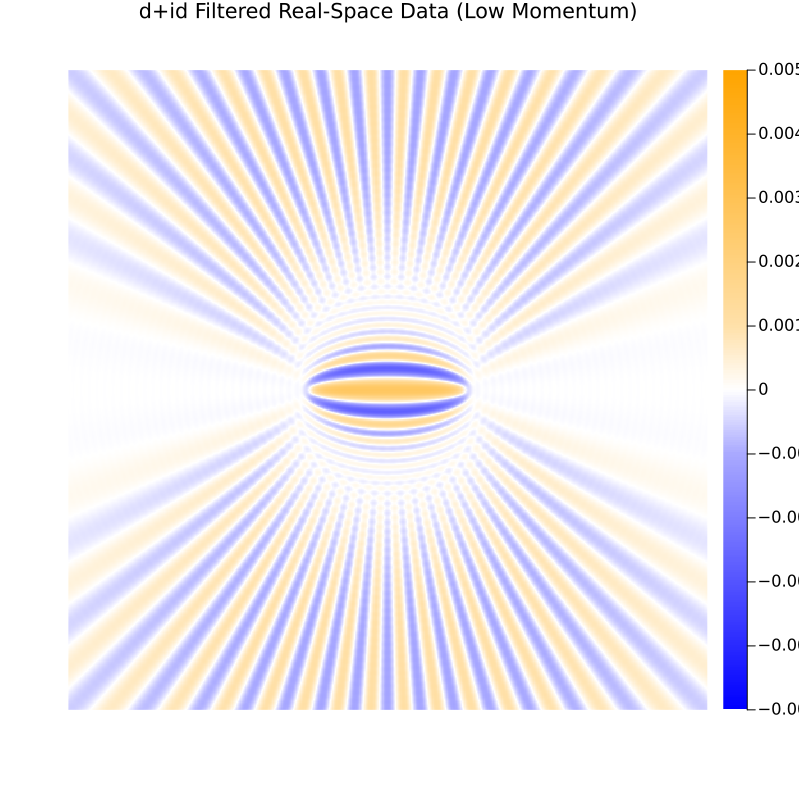

In [118]:
# Step 2: Map back to the unshifted Fourier space
ft_data_filtered = fftshift(ft_data_shifted_filtered)

# Step 3: Perform the Inverse Fourier Transform
filtered_data = ifft(ft_data_filtered)
filtered_data_real = real(filtered_data)
# maxhere = 0.002
heatmap(
    unique_x, unique_y, filtered_data_real,
    color=custom_cmap, aspect_ratio=:equal,
    xlabel="x", ylabel="y",
    xlims=(-20, 20),  # Set the x-axis limits
    ylims=(-20, 20),   # Set the y-axis limits
    clims=(-maxhere,maxhere),
    framestyle=:none,  # Remove axis lines and frame
    size=(800,800),    # Make the plot bigger
    title="d+id Filtered Real-Space Data (Low Momentum)"
)